# GC 7

## i. Introduction

Kopi merupakan komoditas internasional dan banyak negara yang memproduksi kopi seperti brazil indonesia , vietnam , kolombia dsb. Karena penggemar kopi di seluruh dunia juga banyak , berdasarkan website nescafe (salah satu merk kopi instan populer) konsumsi kopi sekitar 400 miliar cup setiap tahunnya. Jadi memang data ini menunjukkan bahwa kopi itu digemari oleh banyak orang. Jika kita asumsikan penduduk di dunia yang menikmati kopi 1 miliar saja  (untuk kemudahan hitungan) maka sehari kita menghabiskan sekitar 1,1 Miliar cup. angka yang cukup fantastis. [link](https://www.nescafe.com/gb/coffee-culture/knowledge/coffee-statistics#:~:text=Coffee%20is%20the%20one%20of%20the%20most%20popular%20drinks%20worldwide&text=On%20average%20there's%20around%20400%20billion%20cups%20consumed%20each%20year)

Jika kita lihat bagaimana pengolahan kopi dan bagaimana kopi itu di perdagangkan secara global, kopi itu diperdagangkan dengan kopi utuh (green bean) yang akan di perdagangkan. Kemudian green bean tersebut dikirim ke negara tujuan. Setelah sampai di negara tujuan, kopi akan di roasting sesuai dengan kebutuhan dari pelanggan. [link2](https://thosecoffeepeople.com/importing-coffee-beans-into-japan-guide/) [link3](https://coffeeassoc.com/supply-chain/) [link4](https://www.sidewalkcoffee.co.uk/pages/about-coffee-how-its-grown-processed-and-shipped#:~:text=Packing%20and%20shipping,transported%20by%20land%20or%20sea). Proses ini tentunya untuk memperpanjang umur kopi dibandingkan proses perdagangan biji kopi yang sudah di roasting.

Setelah menggali dari beberapa sumber [link5](https://mokhabika.com/level-roasting-coffee/) [link6](https://ottencoffee.co.id/majalah/perbedaan-antara-light-medium-dan-dark-roast-pada-kopi) [link7](https://kopitem.com/tentang-kopi/pengertian-roasting-kopi/) pemanggangan kopi itu ditentukan oleh beberapa level. Mulai dari green (untuk kopi yang belum dipanggang) ini biasanya yang dipakai untuk perdagangan dunia. Kopi dipanggang light. Kopi dipanggang medium. Kopi dipanggang dark. 3 klasifikasi ini merupakan secara garis besar bagaimana biji kopi itu dipanggang. Setiap level roasting itu akan menentukan rasa, cara penyeduhan, tingkat keasaman , dan mungkin faktor lain seperti aroma buah aroma kacang yang mungkin bisa muncul di setiap jenis kopi.

Modul ini akan membahas mengenai 3 biji kopi yaitu Laos Typica Bolaven, Doi Chaang, dan Brazil Cerrado. Setiap varietas ini tentunya akan membutuhkan handling berbeda-beda tergantung dari tingkat kematangannya. Semua kopi ini merupakan kopi yang berkualitas unggul dan memiliki daya tarik tersendiri untuk komunitas kopi internasional. Sebagai informasi harga. Laos Typica itu sekitaran 20-30 dolar [link harga](https://laocoffee.nl/our-coffee/). Doi chaang harga perkilo sekitar 50 dolar - 70 dolar [link harga](https://www.amazon.com/s?k=doi+chang+coffee&crid=2CBYQAFFVAAXK&sprefix=doi+chang+cof%2Caps%2C807&ref=nb_sb_ss_ts-doa-p_1_13). Dan kopi brazil cerado 30an dolar per kilonya [link harga](https://www.amazon.com/s?k=brazil+cerado&crid=23I2RT49UVCPW&sprefix=brazil+cerad%2Caps%2C733&ref=nb_sb_noss). Dengan harga segitu harusnya sebagai penikmat kopi harus memastikan bahwa setiap kopi yang di roasting harus memenuhi target tertentu.

Biji kopi ini hanya difokuskan pada 3 varietas tersebut. Dataset diambil dari JJ Mall Jatujak’s, “Bona Coffee.” di bangkok.  saya kurang tau mengapa alasan pengambilan dari 3 biji varietas tertentu itu. Asumsi saya mungkin di mall tersebut itu mungkin varietas yang sering laku merupakan varietas kopi tersebut. Oleh karena itu kemungkinan model ini digunakan untuk memberi panduan kepada pegawai dari mall tersebut. Alasan saya membikin model ini untuk sebagai panduan kepada pecinta 3 biji kopi tersebut bagaimana level roasting yang benar.

Dataset ini berisi
*   Lao typica bolaven hijau (green bean / belum dipanggang)
*   Lao typica bolaven dipanggang Light
*   Doi Chaang dipanggang Medium
*   Brazil Cerrado dipanggang Dark


Objektif = Membuat model penentuan tingkat roasting dari biji kopi untuk 3 varietas. (Doi Chaang, Brazil Cerrado, Laos Typica Bolaven). Dataset untuk green bean (kopi mentah) juga ditambahkan disini, namun hanya pada biji kopi laos typica saja. 2 varietas lain tidak terdapat gambar green bean nya.

Possibility End-User = Perusahaan roasting Kopi, Pecinta kopi yang memiliki alat roasting sendiri, pegawai - pegawai kopi di cafe untuk pecinta kopi speciality.  



## ii. Import Libraries

In [ ]:
# Downgrade version of TensorFlow and tf-keras

!pip install --upgrade "tensorflow<2.16" "tf-keras<2.16"

In [ ]:
# Import libraries yang dibutuhkan

import os
import cv2
import glob
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import tensorflow as tf
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
import shutil
from sklearn.metrics import confusion_matrix, classification_report
import warnings
from keras.applications.vgg16 import VGG16, preprocess_input
warnings.filterwarnings('ignore')


Importing Library Telah Selesai Maka Kita akan coba untuk data loading

## iii. Data Loading

### iii.1. Connect Kaggle API

In [ ]:

# Install Kaggle library in Google Collaboratory

## Install Kaggle library
!pip install kaggle

## Make a directory named `.kaggle`
!mkdir ~/.kaggle

## Copy the kaggle.json into this new directory
!cp kaggle.json ~/.kaggle/

## Change permission for this directory :
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


Installing Kaggle API. Jangan lupa siapkan json token atau key di session colab. Untuk memastikan bahwa API bisa terakses.

In [ ]:
# Download di kagle
!kaggle datasets download -d gpiosenka/coffee-bean-dataset-resized-224-x-224



Dataset URL: https://www.kaggle.com/datasets/gpiosenka/coffee-bean-dataset-resized-224-x-224
License(s): CC-BY-SA-4.0
 96% 138M/144M [00:01<00:00, 89.4MB/s]
100% 144M/144M [00:02<00:00, 72.1MB/s]


Download data set disini. Dataset ini bisa dimounting ke google drive untuk kemudahan user atau programmer. Namun disini tidak kita lakukan saja.

In [ ]:
# selesai terdownload
!unzip coffee-bean-dataset-resized-224-x-224.zip -d /content/coffee_dataset


Archive:  coffee-bean-dataset-resized-224-x-224.zip
  inflating: /content/coffee_dataset/Coffee Bean.csv  
  inflating: /content/coffee_dataset/test/Dark/dark (1).png  
  inflating: /content/coffee_dataset/test/Dark/dark (10).png  
  inflating: /content/coffee_dataset/test/Dark/dark (100).png  
  inflating: /content/coffee_dataset/test/Dark/dark (11).png  
  inflating: /content/coffee_dataset/test/Dark/dark (12).png  
  inflating: /content/coffee_dataset/test/Dark/dark (13).png  
  inflating: /content/coffee_dataset/test/Dark/dark (14).png  
  inflating: /content/coffee_dataset/test/Dark/dark (15).png  
  inflating: /content/coffee_dataset/test/Dark/dark (16).png  
  inflating: /content/coffee_dataset/test/Dark/dark (17).png  
  inflating: /content/coffee_dataset/test/Dark/dark (18).png  
  inflating: /content/coffee_dataset/test/Dark/dark (19).png  
  inflating: /content/coffee_dataset/test/Dark/dark (2).png  
  inflating: /content/coffee_dataset/test/Dark/dark (20).png  
  inflating:

Unzip file telah selesai untuk dataset kita. Lanjut define path untuk memasukkan definisi.

### iii.2. Define Path dan check total data

In [ ]:
# Define path

main_path = '/content/coffee_dataset/'
train_path = os.path.join(main_path, 'train')
test_path = os.path.join(main_path, 'test')

Path sudah terbentuk. kita cek dulu ada berapa kira-kira total test dan train. Untuk memastikan juga bahwa dataset sudah terdefinisi dengan baik.

In [ ]:
# Check how many data in `train_path` and `test_path`

def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - Green : 300
Total Data - Medium : 300
Total Data - Dark : 300
Total Data - Light : 300

Test Path
Total Data - Green : 100
Total Data - Medium : 100
Total Data - Dark : 100
Total Data - Light : 100



Baik dalam train path maupun test path terdapat 4 kelas.

In [ ]:
# Function to visualize the first 5 images from each class

def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    for index in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, index)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Cek Bagaimana bentukan datanya aja.

Class :  Green


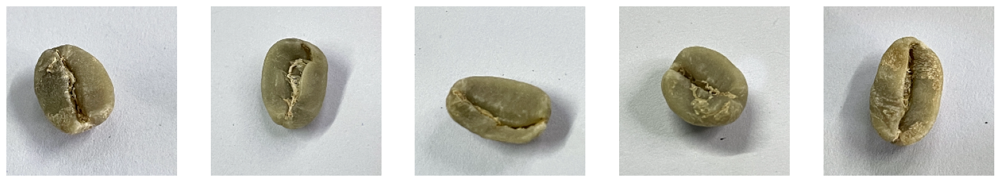

Class :  Medium


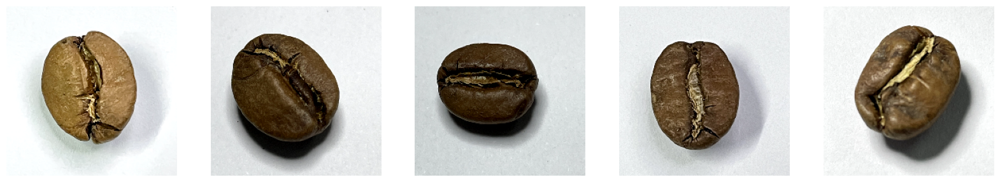

Class :  Dark


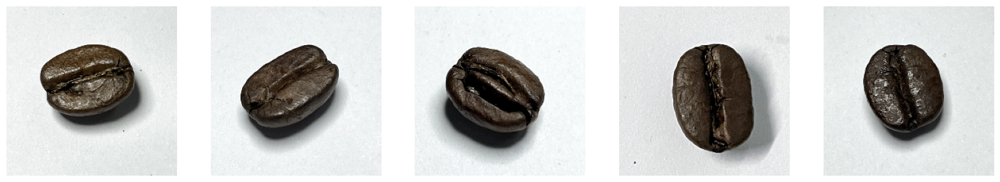

Class :  Light


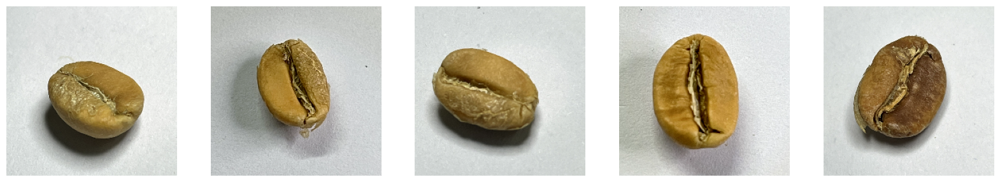

In [ ]:
# Visualization of train_path

plot_images(train_path)

Terdapat 4 label. pada data train. Itu merupakan contoh gambar


Class :  Green


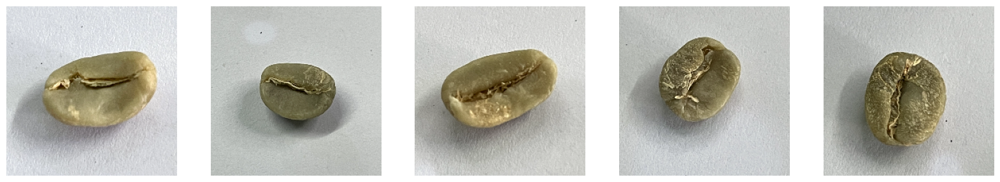

Class :  Medium


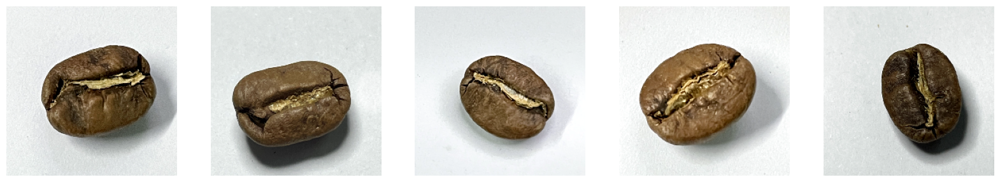

Class :  Dark


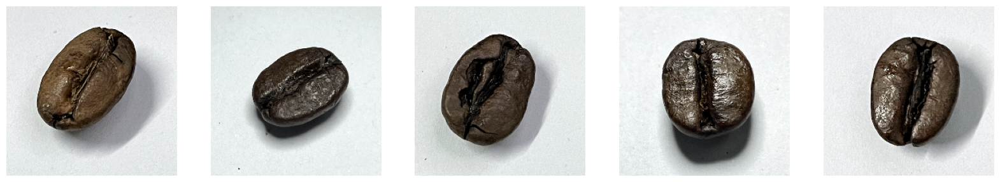

Class :  Light


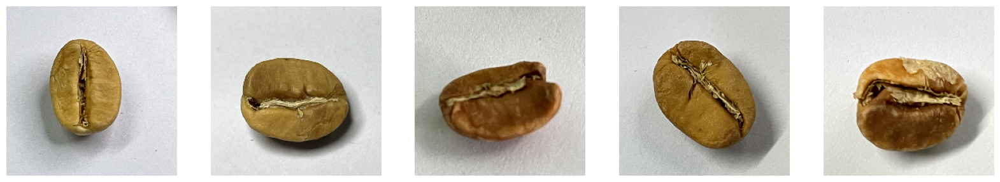

In [ ]:
# Visualization of `test_path`

plot_images(test_path)

Di atas merupakan penampakan dari data test. Penjelasan detail akan dijelaskan pada proses EDA.

## iv. Exploratory Data Analysis (EDA)

Memasukkan ke Data Frame untuk tahu intensitas warna dari semua dataset. Apakah terdapat warna yang mendominasi.

In [ ]:
# Function to load images and convert them to a dataframe
def load_images_to_df(path):
    data = []
    for folder in os.listdir(path):
        folder_path = os.path.join(path, folder)
        if os.path.isdir(folder_path):
            for img_file in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img_file)
                img = Image.open(img_path).convert('RGB')
                img_np = np.array(img)
                r_mean = np.mean(img_np[:, :, 0])
                g_mean = np.mean(img_np[:, :, 1])
                b_mean = np.mean(img_np[:, :, 2])
                data.append([img_path, folder, r_mean, g_mean, b_mean])

    df = pd.DataFrame(data, columns=['image_path', 'label', 'r_mean', 'g_mean', 'b_mean'])
    return df

# Load images from train and test sets
train_df = load_images_to_df(train_path)
test_df = load_images_to_df(test_path)

In [ ]:
train_df.sample()

,image_path,label,r_mean,g_mean,b_mean
1063,/content/coffee_dataset/train/Light/light (190...,Light,162.680246,159.272481,145.322246


dataframe sudah terbuat. Lanjut ke melihat distribusi warna

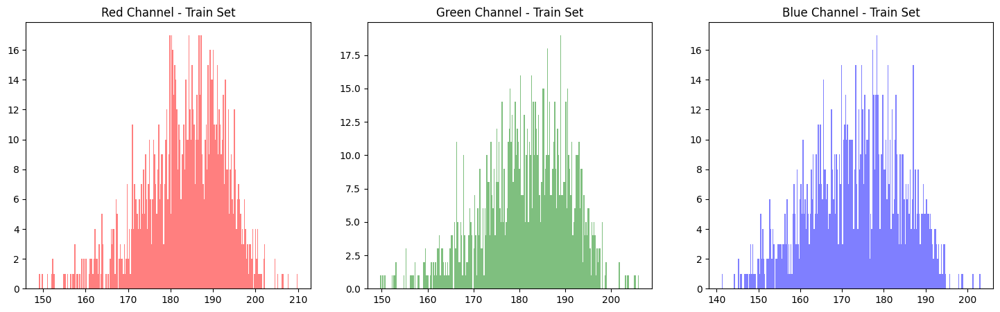

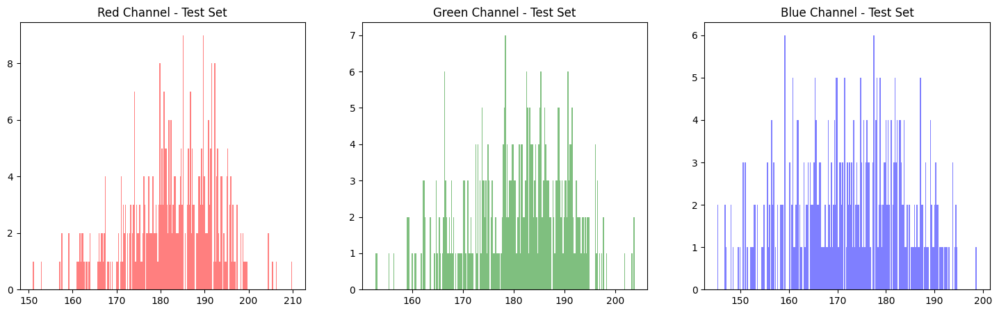

In [ ]:
# Visualisasi distribusi warna
def plot_rgb_distribution(df, label):
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.hist(df['r_mean'], bins=256, color='red', alpha=0.5)
    plt.title(f'Red Channel - {label}')

    plt.subplot(1, 3, 2)
    plt.hist(df['g_mean'], bins=256, color='green', alpha=0.5)
    plt.title(f'Green Channel - {label}')

    plt.subplot(1, 3, 3)
    plt.hist(df['b_mean'], bins=256, color='blue', alpha=0.5)
    plt.title(f'Blue Channel - {label}')

    plt.show()

# Plot distribusi untuk train set dan test set
plot_rgb_distribution(train_df, 'Train Set')
plot_rgb_distribution(test_df, 'Test Set')

Tidak ada distribusi warna yang mendominasi. Terlihat pada data train dan data test tidak terdapat warna yang mendominasi.

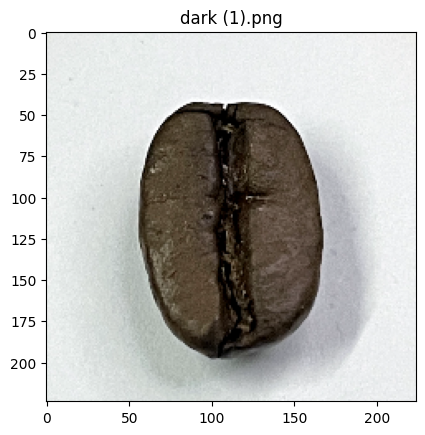

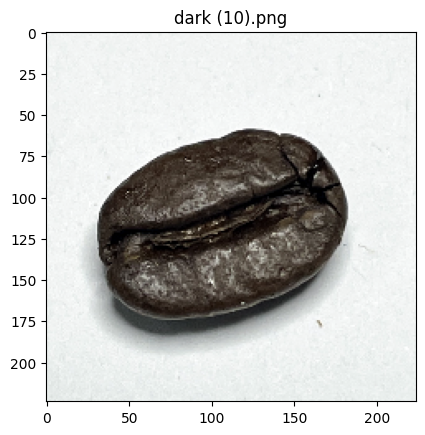

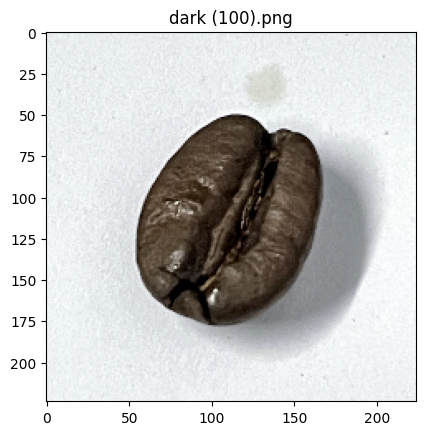

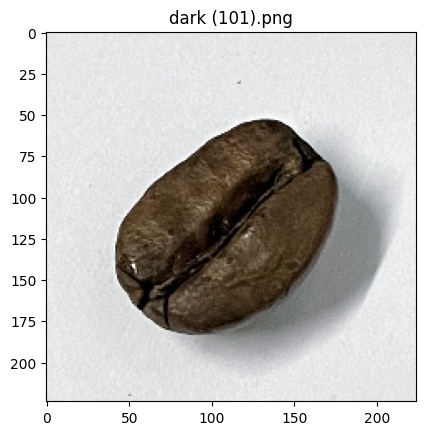

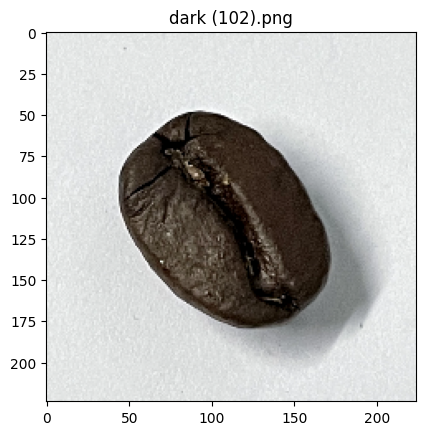

In [ ]:
# Menampilkan 5 gambar pertama
image_folder = '/content/coffee_dataset/train/Dark'
image_files = sorted(os.listdir(image_folder))[:5]  # Mengambil 5 gambar pertama setelah diurutkan

for img_name in image_files:
    img = cv2.imread(os.path.join(image_folder, img_name))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(img_name)
    plt.show()

Kita coba ambil 5 gambar awal dari dark pada train set. Kita lihat disini gambar tidak memiliki posisi yang sama terus menerus. Kita disini gunakan acuan garis tengah dari kopi. Maka Garis biji kopi ini ada yang horizontal ada yang vertikal. Ada juga yang membentuk sudut tertentu 45derajat misalnya. Gambar sudah di bolak balik meskipun pengambilan foto berada dalam studio.

Terlihat pada pola visual, kopi sudah menghitam legam. Retakan-retakan sudah terlihat jelas pada biji kopi. menunjukkan bahwa itu sudah menjadi pemanggangan yang gelap.

Berdasarkan website pecinta kopi [link](https://kopikita.id/mengenal-level-roasting/) Pada level ini, roasting yang berkelanjutan mulai mengurangi aroma dan rasa alami biji kopi. Ini menciptakan rasa yang lebih tebal dan berat dengan keasaman lebih rendah. Kopi dark roast umumnya memiliki penampilan berminyak dan berwarna coklat tua, biji ini biasanya mencapai tahap crack kedua pada suhu sekitar 220 derajat Celsius. Dark roast rata-rata digunakan untuk espresso meskipun bisa untuk proses yang lain juga.

Karena Cerrado adalah biji kopi yang lebih lembut, beberapa pemanggang kopi berpendapat bahwa Cerrado tidak boleh dipanggang terlalu gelap. Pemanggang kopi lainnya berpendapat bahwa Cerrado harus dipanggang gelap, tetapi hati-hati agar tidak gosong. Pemanggangan gelap menghasilkan rasa kacang yang luar biasa dan meningkatkan kekentalan kopi. [link](https://rhoadsroast-coffees.com/products/2-5-lbs-brazil-cerrado-arabica-natural-17-18-screen-dark-roast-coffee-beans?variant=39377795285052) Jadi memang ini lebih nikmat ketika roasting dark sesuai dengan dataset kita.

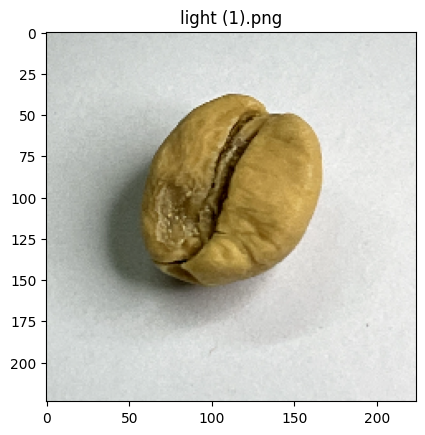

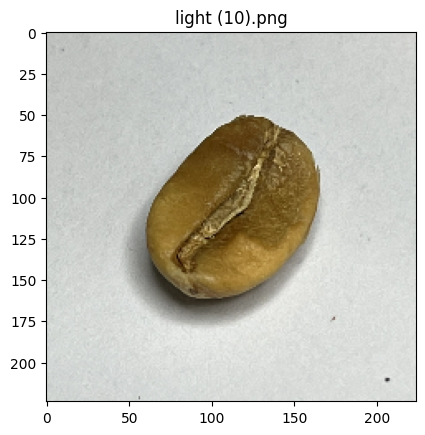

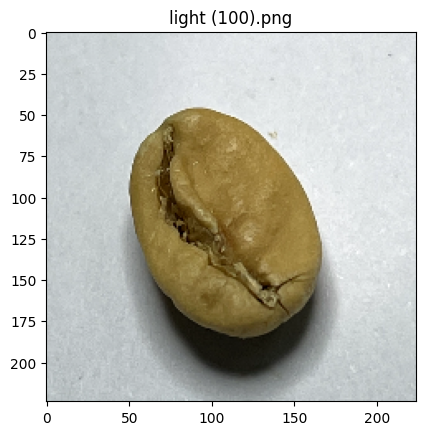

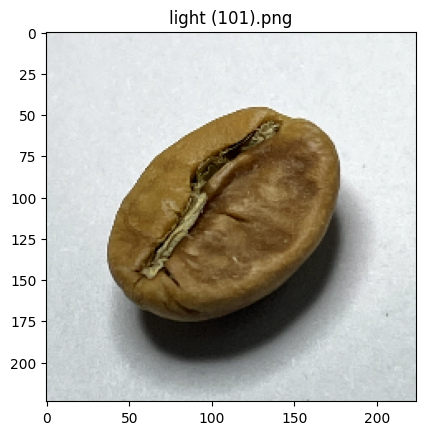

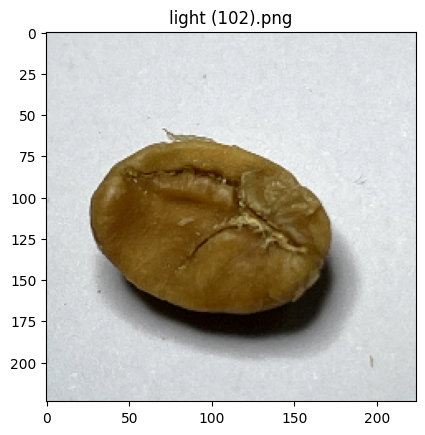

In [ ]:
# Menampilkan 5 gambar pertama
image_folder = '/content/coffee_dataset/train/Light'
image_files = sorted(os.listdir(image_folder))[:5]  # Mengambil 5 gambar pertama setelah diurutkan

for img_name in image_files:
    img = cv2.imread(os.path.join(image_folder, img_name))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(img_name)
    plt.show()

Ambil 5 sampel pertama kopi. Terlihat disini kopi masih berwarna coklat. Namun retakan belum terlihat sempurna. Retakan di pinggir biji belum terbentuk dengan sempurna.

Kopi jenis ini juga cenderung memiliki visual rasa yang lebih cerah daripada jenis dark atau extra dark roast. Dengan tekstur kering, tidak berminyak, biji ini biasanya hanya mencapai sekitar 170 derajat Celsius dan hampir tidak melalui tahap crack pertama.

Kopi light roast seringkali lebih asam dibanding kopi dark roast. Oleh karena itu, kopi dark roasting lebih ringan bagi perut, sedangkan kopi light roast seringkali masih memiliki rasa asli biji kopi mentah. Rasa ini meliputi rasa seperti daun, sayur, maupun kacang-kacangan. [sumber](https://kopikita.id/mengenal-level-roasting/)

Kopi lao bolaven dipanggang light rasanya akan lebih lembut, manis dengan aroma jeruk, dan kadar kafein rendah [link](https://miraclelaocoffee.la/en/2019/11/04/miraclelao-coffee-blends/).

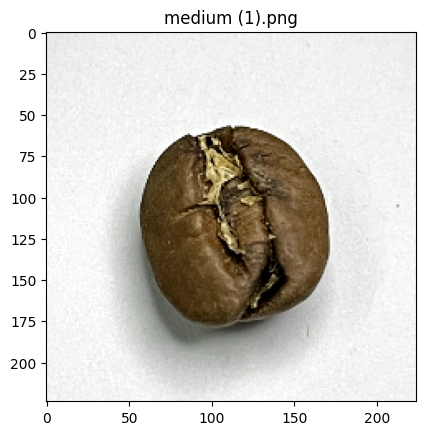

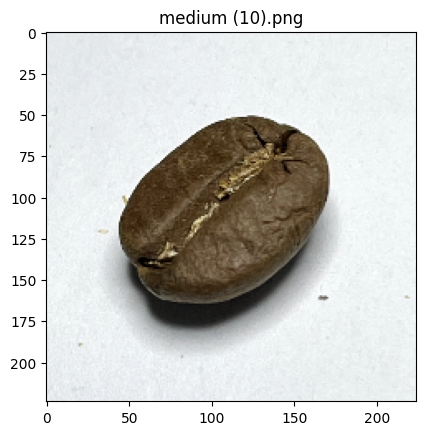

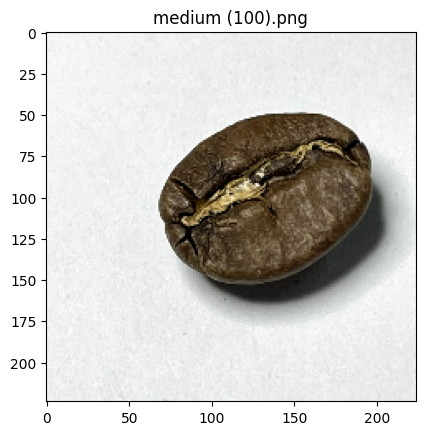

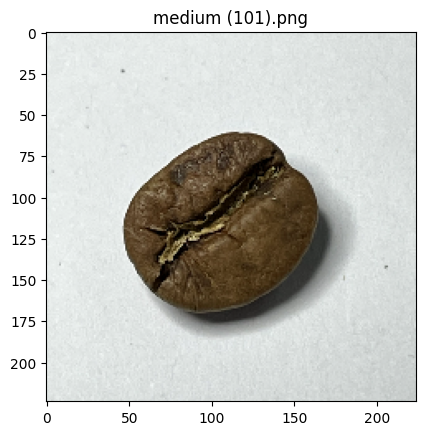

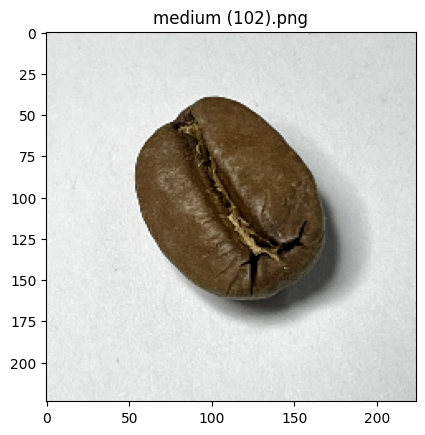

In [ ]:
# Menampilkan 5 gambar pertama
image_folder = '/content/coffee_dataset/train/Medium'
image_files = sorted(os.listdir(image_folder))[:5]  # Mengambil 5 gambar pertama setelah diurutkan

for img_name in image_files:
    img = cv2.imread(os.path.join(image_folder, img_name))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(img_name)
    plt.show()

Pada kopi medium retakan sudah mulai membesar dibandingkan dengan kopi light. Namun perbedaan besarnya terjadi pada warna yang mulai kecoklatan tua. Jika pada kopi light warna coklat lebih muda ada yang yellow juga. Ini pada kopi medium roast warna cenderung coklat tua.

Kopi medium roast ini biasanya menggantikan rasa cerah yang dimiliki light roast dengan rasa karamelisasi manis yang terbentuk oleh waktu roasting yang lebih lama. Biji kopi pada level medium roast ini biasanya masih kering dan jarang terlihat berminyak. Kopi di-roast ke suhu sekitar 200 derajat Celsius, biasanya hanya melewati tahap crack pertama dan setengah tahap crack kedua. [sumber](https://kopikita.id/mengenal-level-roasting/)

Kopi doi chaang jika dipanggang medium akan memberikan Kaya rasa, manisnya renyah. Jeruk seperti jeruk, cemara segar, cokelat hitam, sedikit bumbu panggang dalam aroma dan rasanya. Keasaman seimbang; rasa manis di mulut. Cokelat bertahan dalam rasa yang kaya dan agak kering. [link](https://www.coffeereview.com/review/single-estate-medium/#:~:text=Delicately%20rich%2C%20crisply%20sweet%2Dtoned,Balanced%20acidity%3B%20lightly%20syrupy%20mouthfeel.)

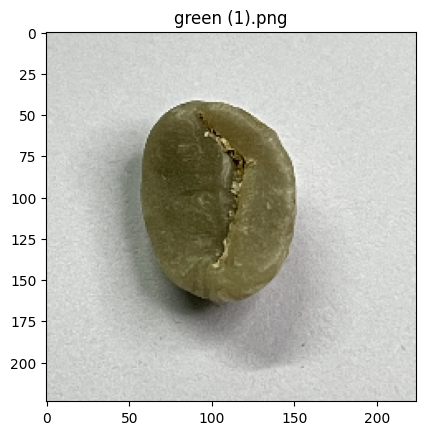

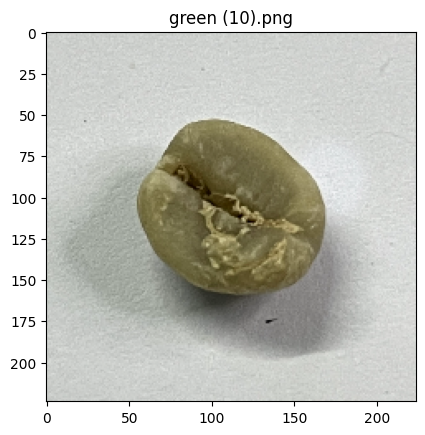

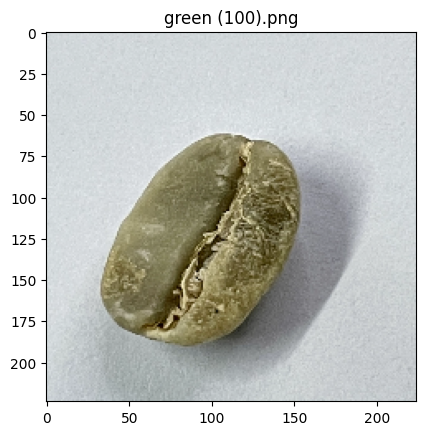

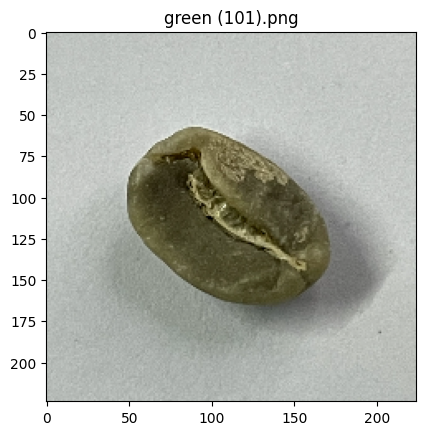

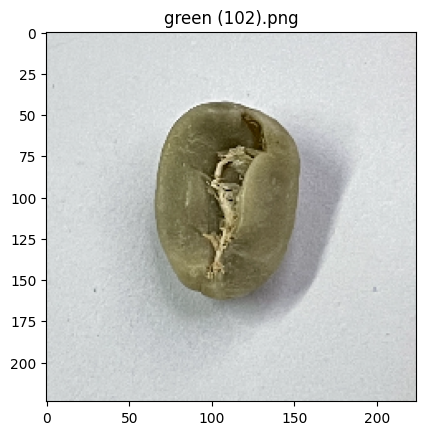

In [ ]:
# Menampilkan 5 gambar pertama
image_folder = '/content/coffee_dataset/train/Green'
image_files = sorted(os.listdir(image_folder))[:5]  # Mengambil 5 gambar pertama setelah diurutkan

for img_name in image_files:
    img = cv2.imread(os.path.join(image_folder, img_name))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(img_name)
    plt.show()

Pada kopi green bean. Terlihat jelas perbedaan di warna hijau. Dan retakan-retakan akibat pemanggangan belum keluar karena memang belum terjadi proses roasting. Retakan kecil terjadi mungkin karena proses penggilingan atau pemanenan. Bukan retak-retak yang seperti terkena pemanasan.

In [ ]:
# Analisis apakah gambar tajam atau Blur
# Ambil dataset aja 1 dari Train
image = cv2.imread('/content/coffee_dataset/train/Light/light (1).png')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Menggunakan Laplacian untuk mendeteksi blur
laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

if laplacian_var < 100:
    print("Gambar ini blur")
else:
    print("Gambar ini tajam")


Gambar ini tajam


Setelah kita ambil satu sampel saja untuk menunjukkan bahwa kualitas gambar ini seperti apa. Memang mata kita pasti menganggap bahwa gambar tersebut memang tajam. Namun kita harus cek ulang dalam komputer apakah data dari gambar ini sudah tajam atau belum.

Dikarenakan pengambilan dari studio maka seharusnya saya bisa mengasumsikan semua gambar disini tajam semua. Terbukti satu gambar saja sudah menunjukkan ketajaman. Jika kita ambil lagi sample pasti juga tajam. Disini cuma membuktikan apakah sudah tajam apa belum, serta untuk menekankan bahwa kamera yang digunakan sudah mumpuni.

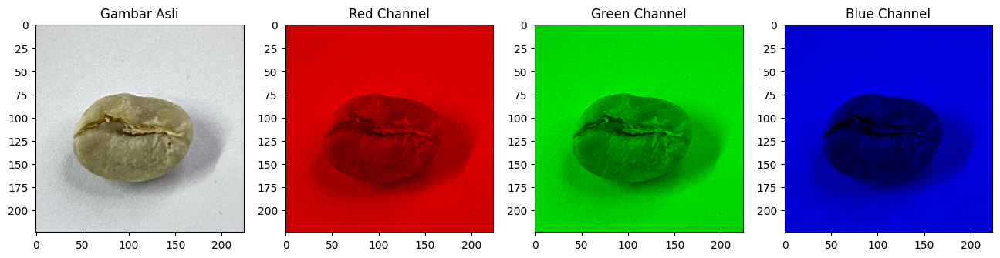

In [ ]:
# function untuk cek colorspace
def check_colorspace(image_path):
    try:
        img = cv2.imread(image_path)
        if img is not None:
            b, g, r = cv2.split(img)

            # Menampilkan gambar asli
            fig, axes = plt.subplots(1, 4, figsize=(16, 4))
            axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axes[0].set_title('Gambar Asli')

            # Membuat gambar baru untuk setiap channel dengan warna asli
            img_r = np.zeros_like(img)
            img_r[:, :, 2] = r

            img_g = np.zeros_like(img)
            img_g[:, :, 1] = g

            img_b = np.zeros_like(img)
            img_b[:, :, 0] = b

            # Channel terpisah di kolom selanjutnya
            axes[1].imshow(cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB))
            axes[1].set_title('Red Channel')
            axes[2].imshow(cv2.cvtColor(img_g, cv2.COLOR_BGR2RGB))
            axes[2].set_title('Green Channel')
            axes[3].imshow(cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB))
            axes[3].set_title('Blue Channel')

            plt.show()
        else:
            print(f"Error: Tidak dapat membaca gambar dari {image_path}")
    except Exception as e:
        print(f"Error: Tidak dapat membaca gambar dari {image_path}: {e}")

image_path = train_df['image_path'][0]  # Mengambil path gambar pertama dari DataFrame Train
check_colorspace(image_path)

Color space sudah benar. Tidak ada warna-warna yang mendominasi dan tidak ada salah deteksi warna.

## v. Feature Engineering

### Preprocessing 1

In [ ]:
# Define hyperparameters

img_height= 220
img_width= 220
batch_size= 64

Penentuan Parameter untuk gambar dan batch. Format ini saya format seperti ini karena untuk kemudahan dengan vgg 16 nantinya. Karena format jika berbeda nanti akan membuat kita harus menentukan 2 kali.

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,  # scaling
                                                                    rotation_range=20,        # dipakein rotation untuk memutar gambar
                                                                    zoom_range=0.05,          # Gambar di zoom acak untuk mengetahui mengatasi jika gambar di zoom
                                                                    width_shift_range=0.05,   # pergeseran gambar horizontal. mengatasi di real world
                                                                    height_shift_range=0.05,  # menggeser gambar vertikal
                                                                    shear_range=0.05,         # penanganan untuk distorsi gambar
                                                                    horizontal_flip=True,     # gambar di flipping karena memang biji sangat mungkin di flip
                                                                    validation_split=0.4)

train_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                                      target_size=(img_height,img_width),
                                                      class_mode='sparse',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_aug = test_datagen_aug.flow_from_directory(test_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    seed=2)

Found 720 images belonging to 4 classes.
Found 480 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


Preprocessing 1 dilakukan dibagi juga 2 pada train ditambah val set. 
Data disini akan di kodefikasi menjadi 4 kelas. 

Kelas akan berisi klas 0 sampai kelas 3 
{'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}

karena python dimulai dari urutan 0 maka dari 0 sampai 3 jadi total 4 kelas. 

kelas 0 untuk dark 
kelas 1 untuk green 
kelas 2 untuk light 
dan kelas 3 untuk medium

kelas itu akan berurutan sesuai folder yang kita urutkan dan otomatis. 



### Preprocessing 2

In [ ]:
# Download pretrained model


pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height,img_width, 3))
pretrained_model.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


Pada Proses kedua untuk improvement kita menggunakan vgg16 untuk improvement model.

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=20,           # dipakein rotation untuk memutar gambar
                                                                   zoom_range=0.05,             # Gambar di zoom acak untuk mengetahui mengatasi jika gambar di zoom
                                                                   width_shift_range=0.05,      # pergeseran gambar horizontal. mengatasi di real world
                                                                   height_shift_range=0.05,     # menggeser gambar vertikal
                                                                   shear_range=0.05,            # penanganan untuk distorsi gambar
                                                                   horizontal_flip=True,        # gambar di flipping karena memang biji sangat mungkin di flip
                                                                   validation_split=0.4,
                                                                   preprocessing_function=preprocess_input)

train_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    subset='training',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

val_set_tl = train_datagen_tl.flow_from_directory(train_path,
                                                  target_size=(img_height,img_width),
                                                  class_mode='sparse',
                                                  subset='validation',
                                                  batch_size=batch_size,
                                                  shuffle=True,
                                                  seed=2)

test_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

test_set_tl = test_datagen_tl.flow_from_directory(test_path,
                                                  target_size=(img_height,img_width),
                                                  class_mode='sparse',
                                                  batch_size=batch_size,
                                                  shuffle=False,
                                                  seed=2)

Found 720 images belonging to 4 classes.
Found 480 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


## vi. ANN Training (Sequential API)

### vi.1, Model Definition

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

Kita lakuin clear session dan penentuan seednya untuk nanti hasil tidak lari-lari.

In [ ]:
# Create Sequential API model

# sequential API
model_aug = Sequential()
model_aug.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(64, (3,3), activation='relu'))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(128, (3,3),activation='relu'))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Flatten())
model_aug.add(Dropout(0.5))
model_aug.add(Dense(512, activation='relu'))
model_aug.add(Dense(6, activation='softmax'))

# Compile
model_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

Model disini saya memakai Sequential API. dengan penggunaan 3*3 matriks untuk convolutional matriksnya digunakan untuk menghemat komputasi. Pooling disini saya menggunakan maks karena saya ingin mendeteksi gambar lebih bagus.

Penggunaan 3 layar konvolusi disini dan ada 2 fully connected layer.
Penggunaan relu untuk activation function membantu model untuk aktifasi neuron yang memiliki hasil positif saja.

Dropout digunakan dengan parameter 50% yang mana neuron akan aktif gantian sekalian mencegah overfitting. 50% adalah adanya separo aktif separo mati.

2 hidden layer dalamny yang berisi fully connected layer juga. Optimizer yang digunain adam. Adam sangat cocok untuk melatih model neural networks yang dalam, seperti Convolutional Neural Networks (CNN). karena ini nanti akan menghindari eksploding gradien. Model jadi akan lebih bagus lah intinya gitu.

Metriks yang akan kita pakai yaitu accuracy, penggunaan matriks ini sesuai karena klasifikasi. Karena pada level roastingan kopi kita tidak ingin missklasifikasi. Kita tidak ingin adanya trade off jika menggunakan recaal atau precision ketika kita ingin memperbesar salah satunya. Fokus kita penebakan prediksi benar saja.



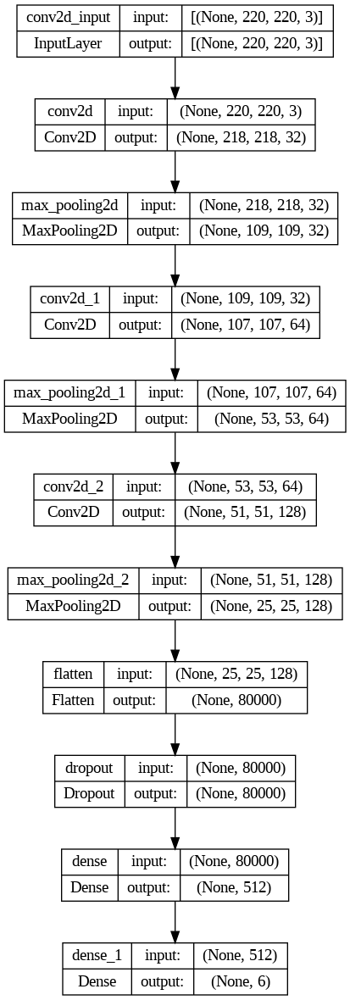

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_aug, show_shapes=True)

Kira kira seperti itulah gambaran arsitekturnya

### vi.2. Model Training

In [ ]:
# Train the model

%%time
history_aug = model_aug.fit(train_set_aug, epochs=20, validation_data=val_set_aug, batch_size=batch_size)

Epoch 1/20
12/12 [==============================] - 32s 2s/step - loss: 1.6412 - accuracy: 0.4403 - val_loss: 0.6923 - val_accuracy: 0.7458
Epoch 2/20
12/12 [==============================] - 15s 1s/step - loss: 0.3769 - accuracy: 0.8611 - val_loss: 0.3451 - val_accuracy: 0.8562
Epoch 3/20
12/12 [==============================] - 17s 1s/step - loss: 0.1850 - accuracy: 0.9347 - val_loss: 0.3807 - val_accuracy: 0.8625
Epoch 4/20
12/12 [==============================] - 18s 2s/step - loss: 0.1585 - accuracy: 0.9389 - val_loss: 0.3374 - val_accuracy: 0.8646
Epoch 5/20
12/12 [==============================] - 21s 2s/step - loss: 0.1433 - accuracy: 0.9486 - val_loss: 0.0880 - val_accuracy: 0.9646
Epoch 6/20
12/12 [==============================] - 16s 1s/step - loss: 0.1229 - accuracy: 0.9569 - val_loss: 0.1208 - val_accuracy: 0.9604
Epoch 7/20
12/12 [==============================] - 20s 2s/step - loss: 0.1180 - accuracy: 0.9569 - val_loss: 0.1989 - val_accuracy: 0.9187
Epoch 8/20
12/12 [==

Waktu pembelajaran model 6 menit an. Model ditraining menggunakan 20 epoch yang mana akan bisa terlihat nanti konvergen atau tidaknya. 

### vi.3. Model Evaluation

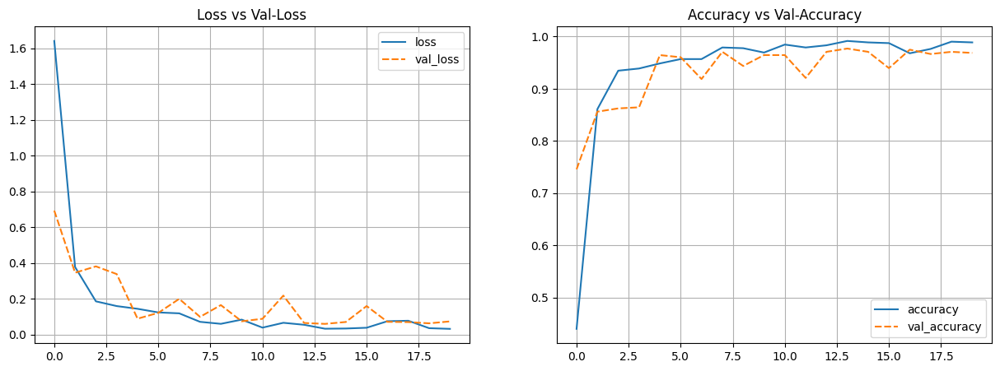

In [ ]:
# Plot training results

history_aug_df = pd.DataFrame(history_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Loss vs Vall Loss

Loss (garis biru) dan Validation Loss (garis oranye putus-putus) menunjukkan seberapa baik model meminimalkan kesalahan selama training dan pada data validasi. Ada beberapa fluktuasi di bagian tengah (sekitar epoch 10-15), tapi secara keseluruhan tetap stabil.

Model menunjukkan tren penurunan yang baik pada loss dan validation loss, menandakan model sedang belajar dengan baik. Namun terdapat fluktuasi fluktuasi kecil karena model sedikit overfitting. Tapi harusnya ini masih okay nanti kita coba perbaiki di improvement.

Accuracy vs Val-Accuracy (Kanan)

Di grafik ini, accuracy model meningkat dengan cepat pada awal epoch dan stabil mendekati 95% +++ setelah sekitar epoch ke-5. Validation accuracy juga mengikuti dengan pola serupa, tetapi sedikit fluktuatif. Sedikit overfitting tapi nanti akan kita perbaiki.



In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob_aug = model_aug.predict_generator(test_set_aug)

## Get class with maximum probability
y_pred_class_aug = np.argmax(y_pred_prob_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

              precision    recall  f1-score   support

        Dark       0.98      0.98      0.98       100
       Green       1.00      0.98      0.99       100
       Light       0.98      1.00      0.99       100
      Medium       0.98      0.98      0.98       100

    accuracy                           0.98       400
   macro avg       0.99      0.98      0.98       400
weighted avg       0.99      0.98      0.98       400



Akurasi disini cukup tinggi. Yaitu 98% model cukup baik untuk memprediksi level roasting biji kopi. Masih terdapat kesalahan false negatif  dan kesalahan false positif pada semua biji itu meskipun nilainya kecil tapi kalau bisa lebih baik kenapa tidak. Kesalahan missklasifikasi fitunjukkan pada nilai recall dan precision masing2 itu.

Meskipun secara overall ini sangat bagus , tapi model ini masih menunjukkan missklasifikasi. Nilainya memang kecil, namun untuk orang-orang yang mendapat eror itu sangat kasihan sekali. Karena dia sudah membeli biji kopi dengan harga mahal, harapannya dengan model machine learning ini mereka bisa mendapatkan hasil yang maksimal, ternyata mereka malah dapat pada saat erornya.  

## vii. ANN Improvement (Sequential API / Functional API)

### vii.1. Model Definition

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

Clear session dan penggunaan random seed 20

In [ ]:
# Create Sequential API model

model_tl = Sequential()
# penggunaan pretrained Model
model_tl.add(pretrained_model)

model_tl.add(Flatten())
model_tl.add(Dense(512, activation='relu'))
model_tl.add(Dense(6, activation='softmax'))

# Compile
model_tl.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_tl.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 dense (Dense)               (None, 512)               9437696   
                                                                 
 dense_1 (Dense)             (None, 6)                 3078      
                                                                 
Total params: 24155462 (92.15 MB)
Trainable params: 9440774 (36.01 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


Menggunakan pretrained Model vgg16 untuk memperbaiki model.

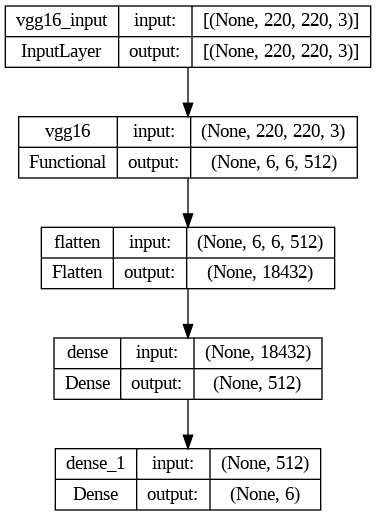

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_tl, show_shapes=True)

### vii.2. Model Training

In [ ]:
# Train the model

%%time
history_tl = model_tl.fit(train_set_tl, epochs=20, validation_data=val_set_tl, batch_size=batch_size)

Epoch 1/20
12/12 [==============================] - 35s 2s/step - loss: 44.6638 - accuracy: 0.5222 - val_loss: 6.8925 - val_accuracy: 0.7917
Epoch 2/20
12/12 [==============================] - 17s 2s/step - loss: 3.6428 - accuracy: 0.9000 - val_loss: 2.9399 - val_accuracy: 0.9021
Epoch 3/20
12/12 [==============================] - 17s 1s/step - loss: 1.1829 - accuracy: 0.9528 - val_loss: 0.3865 - val_accuracy: 0.9646
Epoch 4/20
12/12 [==============================] - 22s 2s/step - loss: 0.1185 - accuracy: 0.9944 - val_loss: 0.4092 - val_accuracy: 0.9854
Epoch 5/20
12/12 [==============================] - 19s 2s/step - loss: 0.1574 - accuracy: 0.9931 - val_loss: 0.8432 - val_accuracy: 0.9604
Epoch 6/20
12/12 [==============================] - 17s 2s/step - loss: 0.1122 - accuracy: 0.9903 - val_loss: 0.1798 - val_accuracy: 0.9896
Epoch 7/20
12/12 [==============================] - 21s 2s/step - loss: 0.1126 - accuracy: 0.9944 - val_loss: 1.1077 - val_accuracy: 0.9583
Epoch 8/20
12/12 [=

Model telah dilatih dengan menggunakan 20 Epoch waktu pembelajaran 6 menit juga namun lebih lama 40 an detik

### vii.3. Model Evaluation

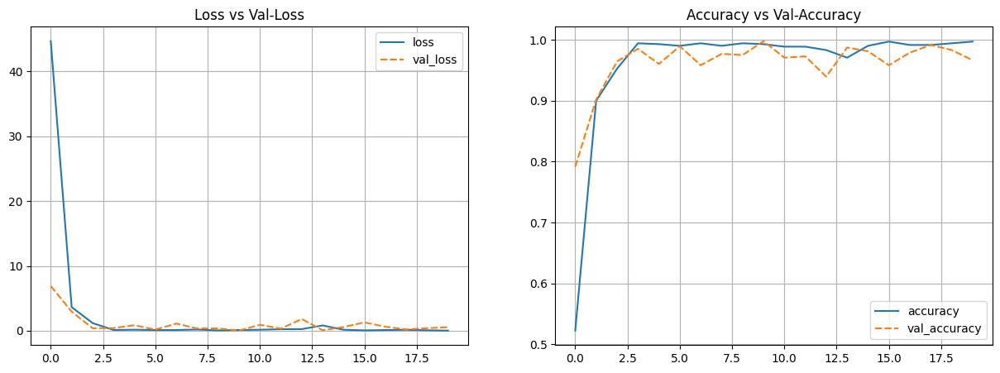

In [ ]:
# Plot training results

history_tl_df = pd.DataFrame(history_tl.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Loss Val Los

Setelah penurunan tajam, baik loss maupun validation loss tetap stabil dan rendah, yang mengindikasikan bahwa model telah mencapai konvergensi dan tidak ada peningkatan yang signifikan dalam kesalahan

Fluktuasi kecil pada validation loss setelah epoch ke-10. Meskipun ini bukan masalah besar, fluktuasi ini dapat menunjukkan sedikit overfitting.

Accuracy vs Val-Accuracy

Akurasi model sangat tinggi, dengan accuracy dan validation accuracy mendekati 1.0. Ini menandakan bahwa model sangat baik dalam memprediksi dengan benar, baik pada data training maupun validasi. Meskipun masih terjadi sedikit overfitting overall masih okay karena sudah berkurang dari model sebelumnya.

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob_tl = model_tl.predict_generator(test_set_tl)

## Get class with maximum probability
y_pred_class_tl = np.argmax(y_pred_prob_tl, axis=-1)

## Display Classification Report
print(classification_report(test_set_tl.classes, y_pred_class_tl, target_names=np.array(list(train_set_tl.class_indices.keys()))))

              precision    recall  f1-score   support

        Dark       1.00      0.99      0.99       100
       Green       1.00      1.00      1.00       100
       Light       1.00      1.00      1.00       100
      Medium       0.99      1.00      1.00       100

    accuracy                           1.00       400
   macro avg       1.00      1.00      1.00       400
weighted avg       1.00      1.00      1.00       400



Precision dan recall sudah menunjukkan perubahan dibandingkan metriks sebelumnya. Kemudian secara makro pada data test juga ternyata accuracy dianggap 100%. Model terdapat improvement yang lebih baik.

Harapannya untuk pecinta kopi yang menggunakan model ini, baik itu untuk perusahaan roasting atau orang pribadi di rumah maka bisa percaya terhadap model kita.

## viii. Model Saving

In [ ]:
# Menyimpan model beserta bobotnya dalam format H5
model_tl.save('my_model.h5')

Model disimpan dalam colab

In [ ]:
# mounting google drive
from google.colab import drive
drive.mount('/content/drive')

# Simpan model ke Google Drive
model_tl.save('/content/drive/My Drive/my_model.h5')


Mounted at /content/drive


Model disimpan di google drive

## ix. Model Inference

Model inference akan dilakukan di notebook yang berbeda. File Model bisa di download di hugging face karena github kurang bisa untuk file besar 200mb +++. Saya juga menyertakan link model untuk download di google drive supaya memudahkan pembaca notebook.

## x. Conclusion

### Recap


Dataset hanya diambil saja dari studio, meskipun demikian dataset tersebut memang sudah dilakukan rotation atau flipping.

Kopi itu ternyata memiliki level roasting masing-masing, disini kita hanya fokus kepada 3 jenis kopi saja dengan perbedaan level roasting yang berbeda terhadap kopi tersebut. Karena setiap biji kopi membutuhkan panggangan level tertentu dan penyajian tertentu terbukti setelah kita cari di beberapa sumber menyebutkan demikian.

Kopi yang kita ingin tahu ini merupakan kopi spesiality. Artinya kopi mahal yang hanya tumbuh di daerah tertentu. Dengan range harga di pasar internasional sangat fantastis harga per kilonya. Rata-rata setelah kita cari tau di angka 30 dolar sampai 50 dolar per kilo atau mungkin lebih untuk varietas lain. Maka dari itu perlunya level roasting yang pas karena biji kopi ini istimewa.

Dataset ini sudah sangat berimbang, terlihat pada data loading terdapat 300 item setiap biji kopi, jadi kemungkinan terjadi bias pada 1 kelas bisa terminimalisir.

Biji kopi pilihan memang beda dari segi 

Model Pertama

Model pertama menunjukkan performansi yang sangat tinggi dengan accuracy 98 %. Kita coba untuk improvement di model kedua. Meskipun terdapat overfitting ringan namun mengingat akurasi tinggi harusnya itu tidak masalah. Improvement untuk melihat performansi model apakah ada improve. Di dalam model itu masih terdapat sedikit misklasifikasi meskipun hanya 1% - 2% saja. 

Model Kedua

Model ini terdapat performansi yang lebih tinggi accuracy mencapai 100%. Recall dan precision sudah lebih baik dibandingkan metriks sebelumnya. Model ini overfitting ringan sudah lebih menurun dibandingkan model sebelumnya. Kesimpulan model kedua jauh lebih baik dibandingkan model pertama.







### Kesimpulan

Dengan mengetahui karakteristik level roasting pada biji kopi . Maka sebagai penikmat kopi bisa menggunakan model ini untuk menentukan level roasting. Untuk green bean nanti untuk verifikasi apakah beannya benar datang secara mentah atau bean yang sudah terpanggang. Takutnya ketika kita beli terjadi penipuan. Model ini sangat spesifik sekali hanya untuk biji kopi doi chaang dengan medium roast, lao typica bolaven light roast dan , brazil cerrado dengan dark roast (untuk model optimal). Dengan asumsi pengambilan kamera pemakaian background putih dibelakang serta satu biji kopi untuk verifikasi  dan diperlihatkan retakan tengah bijinya. Karena retakan inilah yang biasanya memperlihatkan kondisi dari biji kopi tersebut sampai di fase mana. 

Pada model inference menunjukkan bahwa biji kopi lain ternyata bisa  dilakukan juga untuk melakukan hal yang sama, saya mencoba menggunakan biji kopi lain ternyata model masih bisa mendeteksi. Terlebih lagi jika biji dark maka model akan bisa dengan tepat mendeteksi. Ketika mencoba gambar dengan ada noise seperti beberapa biji kopi ditaruh bersamaan model akan cenderung kurang performansinya. Tebakan tepat terjadi ketika gambar input pada model inference dipakai menggunakan 1 biji kopi saja. model bisa mendeteksi dengan baik apakah level dari biji kopi tersebut. 

Model ini sebenarnya akan lebih sempurna dan tepat jika untuk 3 biji kopi saja, namun bisa sebagai acuan saja untuk biji kopi lain. Jika ingin membuat model ML untuk pemakaian biji kopi varietas lain maka hal yang perlu dilakukan. 
1. Analisis permintaan biji kopi spesiality tersebut di pasar. Ditakutkan ternyata biji kopi tersebut permintaan kecil sehingga end user dari model tidak banyak dan model menjadi sia-sia. 
2. Analisis level panggangan (level apakah yang sesuai dengan biji varietas tersebut). Biasanya satu varietas kopi itu menunjukkan level terbaik dengan panggangan tertentu kadang malah bisa memiliki beberapa penyajian dengan level roasting berbeda.
3. Perbanyak inputan foto serta mencoba untuk pemberian foto dengan background real seperti di cafe atau di tangan. Beberapa biji juga bisa ditambahkan untuk membuat model robust. Sehingga model terlatih terhadap dataset yang memiliki banyak biji kopi. 

Model ini nantinya bisa dipakai untuk masyarakat luas seperti pecinta kopi, cafe tempat nongkrong dengan biji kopi spesial, dan perusahaan roasting. Pada perusahaan roasting biji kopi skala besar, model ini nanti akan bisa disambungkan dengan automatisasi dengan sensor robotik dan fitur canggih lainnya. Dengan harapan bisa tercapai otomatisasi tugas pada perusahaan roasting tersebut. Konsep ini mungkin sejalan dengan poin dari industri 4.0 yang mengintegrasi teknologi digital, fisik, dan biologis yang mendorong transformasi fundamental dalam cara produksi, distribusi, dan konsumsi dilakukan mulai awal abad ke-21. 




